In [1]:
!pip -q install rasterio segmentation-models-pytorch==0.3.3 torchmetrics==1.3.0 albumentations opencv-python scipy tifffile


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.5/68.5 kB 7.9 MB/s eta 0:00:00
Reason for being yanked: <none given>
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 26.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 85.9 MB/s eta 0:00:00


**Setup & Imports**

In [33]:
# ==================================================
# Core
# ==================================================
import os
import json
import time
import random
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm

# ==================================================
# Imaging / Geo
# ==================================================
import rasterio
from rasterio.plot import show
import tifffile
from scipy.ndimage import gaussian_filter
from tqdm import tqdm
from PIL import Image

# ==================================================
# Deep Learning
# ==================================================
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

# ==================================================
# Augmentations
# ==================================================
import albumentations as A
from albumentations.pytorch import ToTensorV2

# ==================================================
# Segmentation Models
# ==================================================
import segmentation_models_pytorch as smp
import torchvision
from torchvision.models.segmentation import deeplabv3_resnet50

# ==================================================
# Metrics
# ==================================================
from torchmetrics.classification import (
    MulticlassF1Score,
    MulticlassJaccardIndex,
    MulticlassPrecision,
    MulticlassRecall,
    MulticlassAccuracy
)

**Reproducibility + Device Cell**

In [4]:
def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

SEED = 42
set_seed(SEED)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)

Device: cuda


**Mount Google Drive & Locate TIFF Images**

In [6]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)


Mounted at /content/drive


In [17]:
DATA_DIR = Path("/content/drive/MyDrive/ResearchProject/RGB_Prep_Demo")

assert DATA_DIR.exists(), f"DATA_DIR not found: {DATA_DIR}"
tif_paths = sorted(DATA_DIR.glob("*.tif"))

print("DATA_DIR:", DATA_DIR)
print(f"Number of TIFF files: {len(tif_paths)}")

for p in tif_paths[:5]:
    print(p.name)


DATA_DIR: /content/drive/MyDrive/ResearchProject/RGB_Prep_Demo
Number of TIFF files: 15
930645_se.tif
930650_ne.tif
930660_se.tif
930665_se.tif
930670_ne.tif


**4-band verification**

In [16]:
sample_path = tif_paths[0]
with rasterio.open(sample_path) as src:
    bands = src.read()  # (C, H, W)
    print("Sample:", sample_path.name)
    print("Bands shape:", bands.shape)

Sample: 930645_se.tif
Bands shape: (4, 5000, 5000)


**NDVI + BLUR Labeling Functions**

In [19]:
def compute_ndvi(bands, red_idx=1, nir_idx=4):
    """
    bands: (bands, H, W) from rasterio
    red_idx, nir_idx are 1-based
    """
    red = bands[red_idx - 1].astype("float32")
    nir = bands[nir_idx - 1].astype("float32")
    ndvi = (nir - red) / (nir + red + 1e-6)
    return np.clip(ndvi, -1.0, 1.0)

def blur_multiband(bands, sigma=1.0):
    """
    Apply Gaussian blur per band
    bands: (bands, H, W)
    """
    blurred = np.empty_like(bands, dtype=np.float32)
    for b in range(bands.shape[0]):
        blurred[b] = gaussian_filter(bands[b].astype("float32"), sigma=sigma)
    return blurred


**LABELING GENERATION FOR MASKS(0-3)**

In [23]:
# NDVI thresholds
# 0 = water (NDVI < -0.035)
# 1 = impervious (NDVI >= -0.035 and < 0.2)
# 2 = sparse veg (0.2 – 0.5)
# 3 = dense veg (>= 0.5)
RED_IDX = 1
NIR_IDX = 4

WATER_THR  = -0.035
SPARSE_THR = 0.2
DENSE_THR  = 0.5


# Compute NDVI
ndvi = compute_ndvi(bands, red_idx=RED_IDX, nir_idx=NIR_IDX)

# NDVI -> Integer Mask
mask = np.zeros_like(ndvi, dtype=np.uint8)

mask[ndvi < WATER_THR] = 0
mask[(ndvi >= WATER_THR) & (ndvi < SPARSE_THR)] = 1
mask[(ndvi >= SPARSE_THR) & (ndvi < DENSE_THR)] = 2
mask[ndvi >= DENSE_THR] = 3

**Sanity check: RGB, NDVI, NDWI, mask**

Selected samples:
 - 930645_se.tif
 - 930670_ne.tif
 - 930650_ne.tif


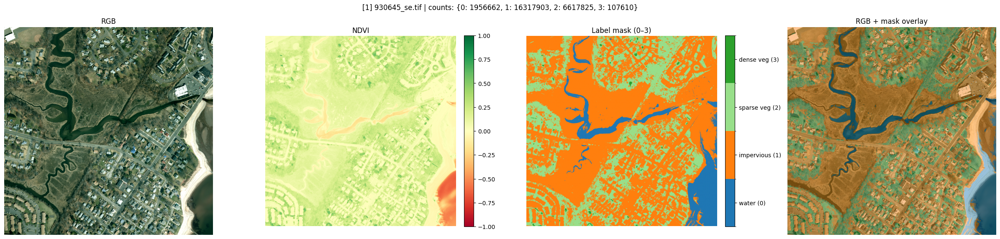

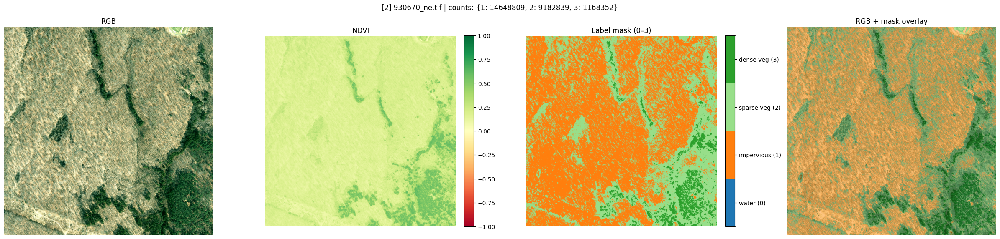

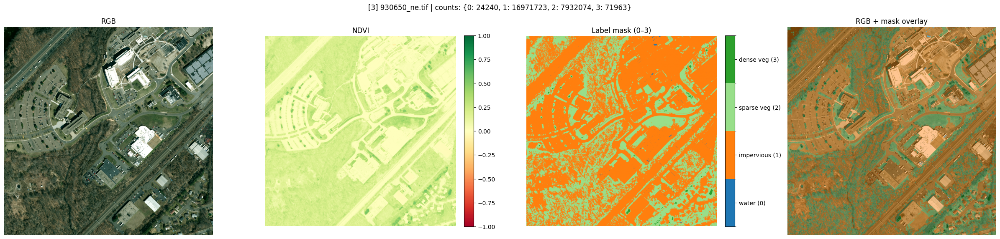

In [24]:
# ---- 1) pick 3 samples ----
SEED_SAMPLES = 123
random.seed(SEED_SAMPLES)

assert len(tif_paths) >= 3, f"Need at least 3 TIFFs, found {len(tif_paths)}"
sample_paths = random.sample(tif_paths, 3)

print("Selected samples:")
for p in sample_paths:
    print(" -", p.name)

# ---- 2) settings ----
USE_BLUR = True
SIGMA = 1.0

# Thresholds (impervious includes ambiguous values >= WATER_THR)
WATER_THR  = -0.035
SPARSE_THR = 0.2
DENSE_THR  = 0.5

# Band indices (1-based for compute_ndvi)
RED_IDX = 1
NIR_IDX = 4

# ---- 3) visualization helpers ----
class_colors = ["#1f77b4", "#ff7f0e", "#98df8a", "#2ca02c"]  # 0..3
cmap_mask = ListedColormap(class_colors)
norm_mask = BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], ncolors=4)

def make_overlay(rgb_disp, mask, alpha=0.45):
    mask_rgb = cmap_mask(norm_mask(mask))[..., :3]  # (H,W,3)
    overlay = (1 - alpha) * rgb_disp + alpha * mask_rgb
    return np.clip(overlay, 0, 1)

def rgb_robust_scale(rgb_hwc):
    """Robust [0,1] scaling using 2nd–98th percentiles."""
    lo, hi = np.percentile(rgb_hwc, (2, 98))
    return np.clip((rgb_hwc - lo) / (hi - lo + 1e-6), 0, 1)

def ndvi_to_mask_inline(ndvi):
    """0 water, 1 impervious, 2 sparse, 3 dense (no gaps)."""
    mask = np.zeros_like(ndvi, dtype=np.uint8)
    mask[ndvi < WATER_THR] = 0
    mask[(ndvi >= WATER_THR) & (ndvi < SPARSE_THR)] = 1
    mask[(ndvi >= SPARSE_THR) & (ndvi < DENSE_THR)] = 2
    mask[ndvi >= DENSE_THR] = 3
    return mask

# ---- 4) loop through samples ----
for i, sample_path in enumerate(sample_paths, start=1):

    with rasterio.open(sample_path) as src:
        bands = src.read()  # (C,H,W)

    # blur only for index computation (optional)
    bands_for_index = blur_multiband(bands, sigma=SIGMA) if USE_BLUR else bands

    # NDVI
    ndvi = compute_ndvi(bands_for_index, red_idx=RED_IDX, nir_idx=NIR_IDX)

    # Mask
    mask = ndvi_to_mask_inline(ndvi)

    # counts
    labels, counts = np.unique(mask, return_counts=True)
    counts_dict = dict(zip(labels.tolist(), counts.tolist()))

    # RGB display
    rgb = np.transpose(bands[:3], (1, 2, 0)).astype(np.float32)  # (H,W,3)
    rgb_disp = rgb_robust_scale(rgb)

    # overlay
    overlay = make_overlay(rgb_disp, mask, alpha=0.45)

    # Plot: RGB | NDVI | Mask | Overlay
    fig, axs = plt.subplots(1, 4, figsize=(24, 6))
    fig.suptitle(f"[{i}] {sample_path.name} | counts: {counts_dict}", fontsize=12)

    axs[0].imshow(rgb_disp)
    axs[0].set_title("RGB")

    im1 = axs[1].imshow(ndvi, cmap="RdYlGn", vmin=-1, vmax=1)
    axs[1].set_title("NDVI")
    plt.colorbar(im1, ax=axs[1], fraction=0.046, pad=0.04)

    im2 = axs[2].imshow(mask, cmap=cmap_mask, norm=norm_mask)
    axs[2].set_title("Label mask (0–3)")
    cbar = plt.colorbar(im2, ax=axs[2], fraction=0.046, pad=0.04, ticks=[0, 1, 2, 3])
    cbar.ax.set_yticklabels(["water (0)", "impervious (1)", "sparse veg (2)", "dense veg (3)"])

    axs[3].imshow(overlay)
    axs[3].set_title("RGB + mask overlay")

    for ax in axs:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

In [25]:
# --- Output folder on Drive---
LABEL_DIR = Path("/content/drive/MyDrive/ResearchProject/RGB_Prep_Demo/labels_ndvi_only")
LABEL_DIR.mkdir(parents=True, exist_ok=True)

# --- Settings ---
USE_BLUR = True
SIGMA = 1.0

# --- Helper: output filename ---
def mask_out_path(tif_path: Path) -> Path:
    # Example: 930645_se.tif -> 930645_se_mask_0_3.tif
    return LABEL_DIR / f"{tif_path.stem}_mask_0_3.tif"

# --- Generate masks ---
saved = 0
skipped = 0

for tif_path in tqdm(tif_paths, desc="Generating full-res masks"):
    out_path = mask_out_path(tif_path)

    if out_path.exists():
        skipped += 1
        continue

    with rasterio.open(tif_path) as src:
        bands = src.read()                 # (C,H,W)
        profile = src.profile.copy()       # preserve georef

    bands_for_index = blur_multiband(bands, sigma=SIGMA) if USE_BLUR else bands
    ndvi = compute_ndvi(bands_for_index, red_idx=RED_IDX, nir_idx=NIR_IDX)

    # mask 0..3 from your thresholds
    mask = np.zeros_like(ndvi, dtype=np.uint8)
    mask[ndvi < WATER_THR] = 0
    mask[(ndvi >= WATER_THR) & (ndvi < SPARSE_THR)] = 1
    mask[(ndvi >= SPARSE_THR) & (ndvi < DENSE_THR)] = 2
    mask[ndvi >= DENSE_THR] = 3

    # write single-band GeoTIFF (uint8)
    profile.update(count=1, dtype=rasterio.uint8)

    with rasterio.open(out_path, "w", **profile) as dst:
        dst.write(mask.astype(np.uint8), 1)

    saved += 1

print(f"Saved: {saved}, Skipped (already existed): {skipped}")
print("Masks saved to:", LABEL_DIR)

Generating full-res masks: 100%|██████████| 15/15 [01:56<00:00,  7.74s/it]

Saved: 15, Skipped (already existed): 0
Masks saved to: /content/drive/MyDrive/ResearchProject/RGB_Prep_Demo/labels_ndvi_only


**Tiling 512 x 512**

In [31]:
def tile_image_and_mask(image, mask, tile_size=512):
    """
    image: (C, H, W)  e.g., RGB as (3, H, W)
    mask:  (H, W)     uint8 labels 0..3
    returns: list of (image_tile, mask_tile)
    """
    C, H, W = image.shape
    tiles = []

    max_y = (H // tile_size) * tile_size
    max_x = (W // tile_size) * tile_size

    for y in range(0, max_y, tile_size):
        for x in range(0, max_x, tile_size):
            img_tile = image[:, y:y+tile_size, x:x+tile_size]
            msk_tile = mask[y:y+tile_size, x:x+tile_size]

            if img_tile.shape[1:] == (tile_size, tile_size) and msk_tile.shape == (tile_size, tile_size):
                tiles.append((img_tile, msk_tile))

    return tiles

**Normalization Cell**

In [41]:
def normalize_rgb_to_uint8(rgb_chw):
    """
    rgb_chw: (3, H, W) uint16 or float
    returns: (3, H, W) uint8 in 0..255
    Uses a percentile stretch to avoid washed-out images.
    """
    x = rgb_chw.astype(np.float32)

    out = np.zeros_like(x, dtype=np.uint8)
    for c in range(3):
        lo, hi = np.percentile(x[c], (2, 98))
        if hi <= lo:
            out[c] = 0
        else:
            xc = (x[c] - lo) / (hi - lo + 1e-6)
            xc = np.clip(xc, 0, 1)
            out[c] = (xc * 255).astype(np.uint8)
    return out

**Saving RGB Tiles and Mask Tiles as PNG to Google Drive**

In [43]:
TILE_SIZE = 512

# Inputs
DATA_DIR  = Path("/content/drive/MyDrive/ResearchProject/RGB_Prep_Demo")
LABEL_DIR = Path("/content/drive/MyDrive/ResearchProject/RGB_Prep_Demo/labels_ndvi_only")

tif_paths = sorted(DATA_DIR.glob("*.tif"))
print("Num image TIFFs:", len(tif_paths))

# Outputs
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject/dataset_tiles_512_v1")
IMG_OUT = TILES_BASE / "images"
MSK_OUT = TILES_BASE / "masks"
IMG_OUT.mkdir(parents=True, exist_ok=True)
MSK_OUT.mkdir(parents=True, exist_ok=True)

saved = 0
missing_masks = 0

for tif_path in tqdm(tif_paths, desc="Tiling & saving PNGs"):
    mask_path = LABEL_DIR / f"{tif_path.stem}_mask_0_3.tif"

    if not mask_path.exists():
        missing_masks += 1
        continue

    # read RGB + mask
    with rasterio.open(tif_path) as src:
      bands = src.read()            # (4,H,W) uint16
      rgb = bands[:3]               # (3,H,W)
      rgb = normalize_rgb_to_uint8(rgb)  #(3,H,W) uint8

    with rasterio.open(mask_path) as src_m:
        mask = src_m.read(1).astype(np.uint8)  # (H,W)

    # tile
    tiles = tile_image_and_mask(rgb, mask, tile_size=TILE_SIZE)

    # save each tile
    for idx, (rgb_tile, msk_tile) in enumerate(tiles):
        rgb_img = np.transpose(rgb_tile, (1, 2, 0))  # (512,512,3)

        img_name = f"{tif_path.stem}_t{idx:04d}.png"
        msk_name = f"{tif_path.stem}_t{idx:04d}_mask.png"

        Image.fromarray(rgb_img).save(IMG_OUT / img_name)
        Image.fromarray(msk_tile).save(MSK_OUT / msk_name)

        saved += 1

print(f"Saved tiles: {saved}")
print(f"Missing masks: {missing_masks}")
print("Tiles saved to:", TILES_BASE)

Num image TIFFs: 15


Tiling & saving PNGs: 100%|██████████| 15/15 [02:48<00:00, 11.22s/it]

Saved tiles: 1215
Missing masks: 0
Tiles saved to: /content/drive/MyDrive/ResearchProject/dataset_tiles_512_v1


Total image tiles: 1215
Random image: 930645_se_t0078.png
Mask exists: True
Image shape: (512, 512, 3)
Mask shape: (512, 512)
Mask dtype: uint8
Mask unique values: [1 2 3]


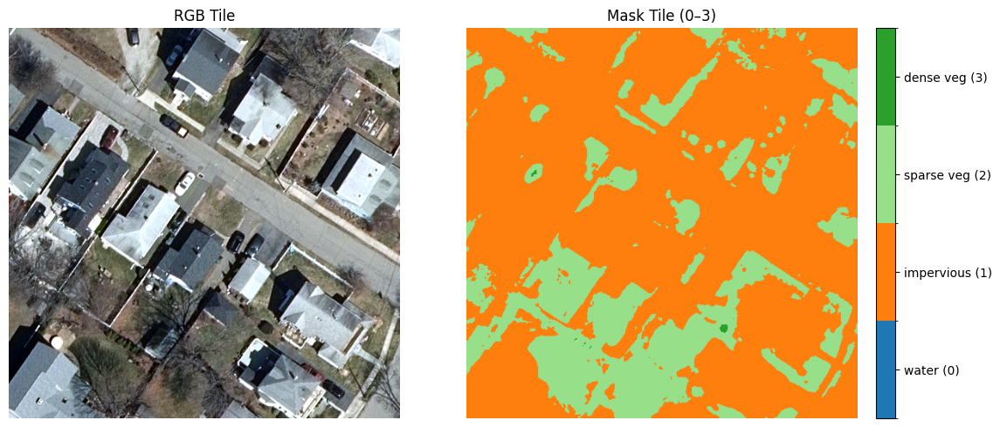

In [44]:
# ---- Tile folders ----
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject/dataset_tiles_512_v1")
IMG_DIR = TILES_BASE / "images"
MSK_DIR = TILES_BASE / "masks"

# ---- Get all image tiles ----
image_files = sorted(IMG_DIR.glob("*.png"))
assert len(image_files) > 0, f"No image tiles found in {IMG_DIR}"
print("Total image tiles:", len(image_files))

# ---- Pick random tile ----
rand_img_path = random.choice(image_files)
rand_mask_path = MSK_DIR / f"{rand_img_path.stem}_mask.png"

print("Random image:", rand_img_path.name)
print("Mask exists:", rand_mask_path.exists())
assert rand_mask_path.exists(), f"Missing mask tile for {rand_img_path.name}"

# ---- Load ----
img = np.array(Image.open(rand_img_path))          # (512,512,3)
mask = np.array(Image.open(rand_mask_path))        # should be (512,512)

# Safety: if mask accidentally loads as RGB, keep one channel
if mask.ndim == 3:
    mask = mask[..., 0]

mask = mask.astype(np.uint8)

print("Image shape:", img.shape)
print("Mask shape:", mask.shape)
print("Mask dtype:", mask.dtype)
print("Mask unique values:", np.unique(mask))

# ---- Correct class colormap (0..3) ----
# 0 water (blue), 1 impervious (orange), 2 sparse veg (light green), 3 dense veg (dark green)
class_colors = ["#1f77b4", "#ff7f0e", "#98df8a", "#2ca02c"]
cmap_mask = ListedColormap(class_colors)
norm_mask = BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], ncolors=4)

# ---- Plot ----
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.title("RGB Tile")
plt.imshow(img)
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Mask Tile (0–3)")
im = plt.imshow(mask, cmap=cmap_mask, norm=norm_mask)
plt.axis("off")

# One colorbar with class names
cbar = plt.colorbar(im, fraction=0.046, pad=0.04, ticks=[0, 1, 2, 3])
cbar.ax.set_yticklabels(["water (0)", "impervious (1)", "sparse veg (2)", "dense veg (3)"])

plt.tight_layout()
plt.show()

**Class Balance Check**

In [48]:
MSK_DIR = Path("/content/drive/MyDrive/ResearchProject/dataset_tiles_512_uint8_norm/masks")

mask_files = sorted(MSK_DIR.glob("*.png"))

total_counts = np.zeros(4)

for msk_path in tqdm(mask_files):
    mask = np.array(Image.open(msk_path))
    unique, counts = np.unique(mask, return_counts=True)
    for u, c in zip(unique, counts):
        total_counts[u] += c

total_pixels = total_counts.sum()

for cls in range(4):
    print(f"Class {cls}: {total_counts[cls]:.0f} pixels ({total_counts[cls]/total_pixels:.2%})")

100%|██████████| 1215/1215 [00:12<00:00, 95.46it/s] 

Class 0: 50400053 pixels (15.82%)
Class 1: 167495759 pixels (52.59%)
Class 2: 98836004 pixels (31.03%)
Class 3: 1773144 pixels (0.56%)


**Train/Val/Test Split**

In [49]:
# ----- Paths -----
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject/dataset_tiles_512_uint8_norm")
IMG_DIR = TILES_BASE / "images"
MSK_DIR = TILES_BASE / "masks"

assert IMG_DIR.exists(), f"Missing: {IMG_DIR}"
assert MSK_DIR.exists(), f"Missing: {MSK_DIR}"

# ----- Collect image files -----
img_files = sorted(IMG_DIR.glob("*.png"))

pairs = []
missing = 0

for img_fp in img_files:
    msk_fp = MSK_DIR / f"{img_fp.stem}_mask.png"

    if not msk_fp.exists():
        missing += 1
        continue

    pairs.append((img_fp, msk_fp))

print("Num image tiles found:", len(img_files))
print("Paired tiles:", len(pairs))
print("Missing masks:", missing)

# ----- Train / Val / Test Split -----
SEED = 42
random.seed(SEED)

idx = list(range(len(pairs)))
random.shuffle(idx)

train_ratio = 0.80
val_ratio   = 0.10

n = len(idx)
train_end = int(train_ratio * n)
val_end   = int((train_ratio + val_ratio) * n)

train_idx = idx[:train_end]
val_idx   = idx[train_end:val_end]
test_idx  = idx[val_end:]

train_pairs = [pairs[i] for i in train_idx]
val_pairs   = [pairs[i] for i in val_idx]
test_pairs  = [pairs[i] for i in test_idx]

print(f"Split sizes -> train: {len(train_pairs)}, val: {len(val_pairs)}, test: {len(test_pairs)}")

Num image tiles found: 1215
Paired tiles: 1215
Missing masks: 0
Split sizes -> train: 972, val: 121, test: 122


**Dataset Class + Data Augmentations + Data Loader**

In [50]:
# ---- Augmentations ----
# Train gets augmentation; Val/Test do not (only normalize + to tensor)
train_tf = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.10, rotate_limit=15, p=0.5),
    A.Normalize(mean=(0.0, 0.0, 0.0), std=(1.0, 1.0, 1.0)),  # keeps your existing [0,1] scale logic simple
    ToTensorV2()
])

eval_tf = A.Compose([
    A.Normalize(mean=(0.0, 0.0, 0.0), std=(1.0, 1.0, 1.0)),
    ToTensorV2()
])


# ---- Dataset ----
class TileSegDataset(Dataset):
    def __init__(self, pairs, indices, transform=None):
        self.pairs = pairs
        self.indices = indices
        self.transform = transform

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, i):
        img_fp, msk_fp = self.pairs[self.indices[i]]

        # RGB image uint8 (H,W,3)
        image = np.array(Image.open(img_fp).convert("RGB"), dtype=np.uint8)

        # mask uint8 (H,W) with labels {0,1,2,3}
        mask = np.array(Image.open(msk_fp), dtype=np.uint8)
        if mask.ndim == 3:          # safety (if saved as RGB accidentally)
            mask = mask[..., 0]

        # apply augmentations (mask stays integer labels)
        if self.transform is not None:
            out = self.transform(image=image, mask=mask)
            image = out["image"]                # torch float32 (3,H,W)
            mask  = out["mask"].long()          # torch int64 (H,W)
        else:
            # fallback (no albumentations): manual conversion
            image = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
            mask  = torch.from_numpy(mask).long()

        return image, mask


# ---- Datasets + Loaders ----
BATCH_SIZE = 4

train_ds = TileSegDataset(pairs, train_idx, transform=train_tf)
val_ds   = TileSegDataset(pairs, val_idx,   transform=eval_tf)
test_ds  = TileSegDataset(pairs, test_idx,  transform=eval_tf)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# ---- Quick sanity check ----
x, y = next(iter(train_loader))
print("Batch images:", x.shape, x.dtype)   # (B,3,512,512), float32
print("Batch masks :", y.shape, y.dtype)   # (B,512,512), int64
print("Unique labels in batch:", torch.unique(y))


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Batch images: torch.Size([4, 3, 512, 512]) torch.float32
Batch masks : torch.Size([4, 512, 512]) torch.int64
Unique labels in batch: tensor([0, 1, 2, 3])


**Metrics (F1,IoU,Precision/Recall per class, Pixel Accuracy)**

In [61]:
NUM_CLASSES = 4

def build_metrics(device):
    metrics = {
        "f1_macro": MulticlassF1Score(num_classes=NUM_CLASSES, average="macro").to(device),
        "f1_per_class": MulticlassF1Score(num_classes=NUM_CLASSES, average=None).to(device),

        "iou_macro": MulticlassJaccardIndex(num_classes=NUM_CLASSES, average="macro").to(device),
        "iou_per_class": MulticlassJaccardIndex(num_classes=NUM_CLASSES, average=None).to(device),

        "prec_per_class": MulticlassPrecision(num_classes=NUM_CLASSES, average=None).to(device),
        "rec_per_class": MulticlassRecall(num_classes=NUM_CLASSES, average=None).to(device),

        "pixel_acc": MulticlassAccuracy(num_classes=NUM_CLASSES, average="micro").to(device),
    }
    return metrics

@torch.no_grad()
def reset_metrics(metrics: dict):
    for m in metrics.values():
        m.reset()

@torch.no_grad()
def update_metrics(metrics: dict, preds: torch.Tensor, targets: torch.Tensor):
    """
    preds: (B,H,W) int64
    targets: (B,H,W) int64
    """
    for m in metrics.values():
        m.update(preds, targets)

@torch.no_grad()
def compute_metrics(metrics: dict):
    out = {}
    for k, m in metrics.items():
        val = m.compute()
        out[k] = val.detach().cpu()
    return out

**Training Loop(Epochs)**

In [66]:
def run_one_epoch(model, loader, optimizer, device, train=True):
    if train:
        model.train()
    else:
        model.eval()

    metrics = build_metrics(device)
    reset_metrics(metrics)

    total_loss = 0.0
    n_batches = 0

    start = time.perf_counter()

    for x, y in loader:
        x = x.to(device, non_blocking=True)   # (B,3,512,512)
        y = y.to(device, non_blocking=True)   # (B,512,512)

        if train:
            optimizer.zero_grad(set_to_none=True)

        with torch.set_grad_enabled(train):
            logits = model(x)                 # expected (B,C,H,W)
            # Some torchvision seg models return dict: {"out": ...}
            if isinstance(logits, dict):
                logits = logits["out"]

            loss = combined_loss(logits, y)

            if train:
                loss.backward()
                optimizer.step()

        total_loss += loss.item()
        n_batches += 1

        preds = torch.argmax(logits, dim=1)   # (B,H,W)
        update_metrics(metrics, preds, y)

    elapsed = time.perf_counter() - start

    metrics_out = compute_metrics(metrics)
    avg_loss = total_loss / max(1, n_batches)

    return avg_loss, metrics_out, elapsed


In [67]:
def train_model(
    model,
    train_loader,
    val_loader,
    model_name: str,
    device,
    lr=1e-4,
    weight_decay=1e-4,
    epochs=10,
    results_dir="/content/drive/MyDrive/ResearchProject (1)/model_results(1)"
):
    results_dir = Path(results_dir)
    results_dir.mkdir(parents=True, exist_ok=True)

    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)

    history = []
    best = {
        "epoch": None,
        "val_f1_macro": -1.0,
        "path_ckpt": None,
        "path_metrics": None
    }

    for epoch in range(1, epochs + 1):
        tr_loss, tr_metrics, tr_time = run_one_epoch(model, train_loader, optimizer, device, train=True)
        va_loss, va_metrics, va_time = run_one_epoch(model, val_loader, optimizer, device, train=False)

        # choose best by val mean F1 (macro)
        val_f1 = float(va_metrics["f1_macro"].item())

        row = {
            "epoch": epoch,
            "train_loss": tr_loss,
            "val_loss": va_loss,
            "train_time_sec": tr_time,
            "val_time_sec": va_time,

            "train_f1_macro": float(tr_metrics["f1_macro"].item()),
            "val_f1_macro": val_f1,

            "train_iou_macro": float(tr_metrics["iou_macro"].item()),
            "val_iou_macro": float(va_metrics["iou_macro"].item()),

            "val_pixel_acc": float(va_metrics["pixel_acc"].item()),

            "val_f1_per_class": va_metrics["f1_per_class"].tolist(),
            "val_iou_per_class": va_metrics["iou_per_class"].tolist(),
            "val_prec_per_class": va_metrics["prec_per_class"].tolist(),
            "val_rec_per_class": va_metrics["rec_per_class"].tolist(),
        }
        history.append(row)

        print(
            f"[{model_name}] Epoch {epoch:02d}/{epochs} | "
            f"val_f1={row['val_f1_macro']:.4f} val_iou={row['val_iou_macro']:.4f} "
            f"loss={row['val_loss']:.4f} | "
            f"time(train/val)={tr_time:.1f}s/{va_time:.1f}s"
        )

        if val_f1 > best["val_f1_macro"]:
            best["val_f1_macro"] = val_f1
            best["epoch"] = epoch

            ckpt_path = results_dir / f"{model_name}_best.pt"
            metrics_path = results_dir / f"{model_name}_best_metrics.json"

            torch.save(model.state_dict(), ckpt_path)
            with open(metrics_path, "w") as f:
                json.dump({"best": row, "history": history}, f, indent=2)

            best["path_ckpt"] = str(ckpt_path)
            best["path_metrics"] = str(metrics_path)

    print("\nBest epoch:", best["epoch"], "| Best val mean F1:", best["val_f1_macro"])
    print("Saved checkpoint:", best["path_ckpt"])
    print("Saved metrics:", best["path_metrics"])

    return best, history


**Loss Function (CE + Dice)**

In [65]:
ce_loss = nn.CrossEntropyLoss()

def dice_loss(logits, targets, num_classes=4, eps=1e-6):
    """
    logits: (B, C, H, W)
    targets: (B, H, W) with class labels
    """
    probs = F.softmax(logits, dim=1)              # (B,C,H,W)
    targets_oh = F.one_hot(targets, num_classes)  # (B,H,W,C)
    targets_oh = targets_oh.permute(0, 3, 1, 2).float()

    dims = (0, 2, 3)
    intersection = torch.sum(probs * targets_oh, dims)
    union = torch.sum(probs + targets_oh, dims)

    dice = (2 * intersection + eps) / (union + eps)
    return 1 - dice.mean()

def combined_loss(logits, targets):
    return ce_loss(logits, targets) + dice_loss(logits, targets)

**U-Net(SMP) Model**

In [68]:
MODEL_NAME = "FullUNet_23L"

ENCODER = "resnet34"
ENCODER_WEIGHTS = "imagenet"  # good default

model_unet = smp.Unet(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    in_channels=3,
    classes=4,
    activation=None
).to(DEVICE)

print("Model:", MODEL_NAME)
print("Encoder:", ENCODER)

# ---- Train and save BEST epoch (by val mean F1) ----
best_unet, hist_unet = train_model(
    model=model_unet,
    train_loader=train_loader,
    val_loader=val_loader,
    model_name=MODEL_NAME,
    device=DEVICE,
    lr=1e-4,
    weight_decay=1e-4,
    epochs=10,
    results_dir="/content/drive/MyDrive/ResearchProject (1)/model_results(1)"
)


Model: FullUNet_23L
Encoder: resnet34
[FullUNet_23L] Epoch 01/10 | val_f1=0.6720 val_iou=0.6096 loss=0.9691 | time(train/val)=15.2s/1.6s
[FullUNet_23L] Epoch 02/10 | val_f1=0.7433 val_iou=0.6295 loss=0.9184 | time(train/val)=13.4s/1.6s
[FullUNet_23L] Epoch 03/10 | val_f1=0.8111 val_iou=0.7119 loss=0.7613 | time(train/val)=15.3s/1.6s
[FullUNet_23L] Epoch 04/10 | val_f1=0.8160 val_iou=0.7194 loss=0.6755 | time(train/val)=15.0s/1.6s
[FullUNet_23L] Epoch 05/10 | val_f1=0.8198 val_iou=0.7229 loss=0.6596 | time(train/val)=15.4s/1.5s
[FullUNet_23L] Epoch 06/10 | val_f1=0.8058 val_iou=0.6995 loss=0.6690 | time(train/val)=15.4s/1.6s
[FullUNet_23L] Epoch 07/10 | val_f1=0.8321 val_iou=0.7313 loss=0.6504 | time(train/val)=13.5s/1.6s
[FullUNet_23L] Epoch 08/10 | val_f1=0.8195 val_iou=0.7161 loss=0.6544 | time(train/val)=15.4s/1.6s
[FullUNet_23L] Epoch 09/10 | val_f1=0.8286 val_iou=0.7264 loss=0.6282 | time(train/val)=13.6s/1.6s
[FullUNet_23L] Epoch 10/10 | val_f1=0.8414 val_iou=0.7489 loss=0.5536 |

**UNet Loss vs Epoch Graph**

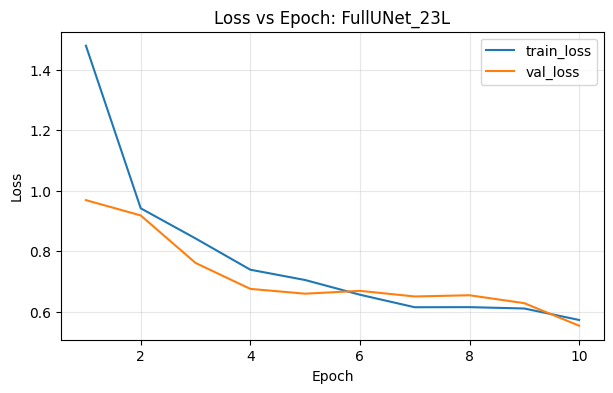

Best epoch: 10 | Best val_f1_macro: 0.8414158225059509


In [69]:
RESULTS_DIR = Path("/content/drive/MyDrive/ResearchProject (1)/model_results(1)")
MODEL_NAME = "FullUNet_23L"
METRICS_JSON = RESULTS_DIR / f"{MODEL_NAME}_best_metrics.json"

assert METRICS_JSON.exists(), f"Missing metrics JSON: {METRICS_JSON}"

with open(METRICS_JSON, "r") as f:
    data = json.load(f)

history = data["history"]
epochs = [h["epoch"] for h in history]
train_loss = [h["train_loss"] for h in history]
val_loss   = [h["val_loss"] for h in history]

plt.figure(figsize=(7,4))
plt.plot(epochs, train_loss, label="train_loss")
plt.plot(epochs, val_loss, label="val_loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title(f"Loss vs Epoch: {MODEL_NAME}")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print("Best epoch:", data["best"]["epoch"], "| Best val_f1_macro:", data["best"]["val_f1_macro"])


**Locked Visuals for Analysis of Models**

/tmp/ipython-input-5945/3622999202.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


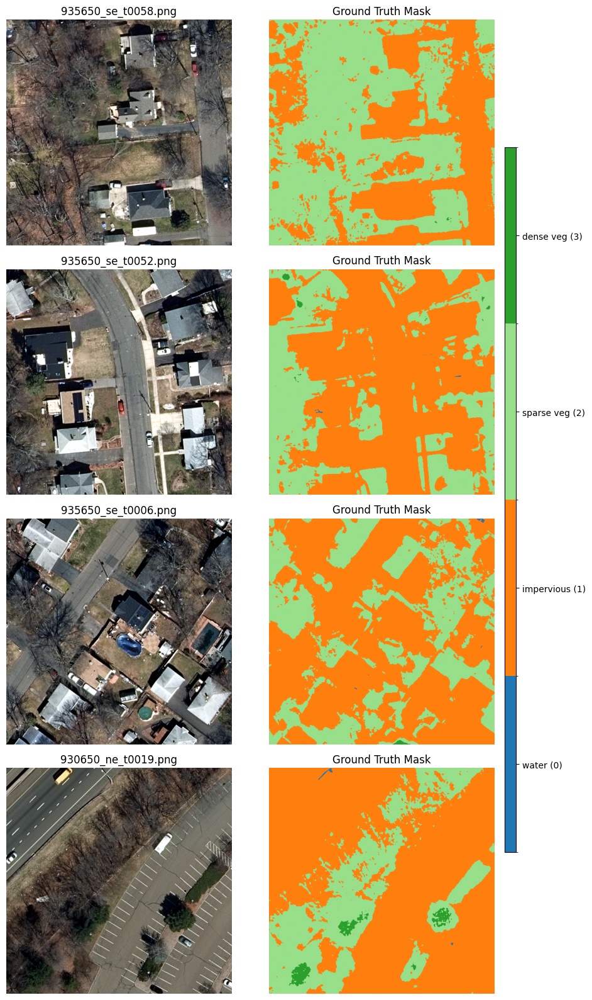

In [90]:
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject/dataset_tiles_512_uint8_norm")
IMG_DIR = TILES_BASE / "images"
MSK_DIR = TILES_BASE / "masks"

# Locked tiles
FIXED_TILES = [
    "935650_se_t0058.png",
    "935650_se_t0052.png",
    "935650_se_t0006.png",
    "930650_ne_t0019.png",
]

# Class setup
class_names  = ["water (0)", "impervious (1)", "sparse veg (2)", "dense veg (3)"]
class_colors = ["#1f77b4", "#ff7f0e", "#98df8a", "#2ca02c"]
cmap_mask = ListedColormap(class_colors)
norm_mask = BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], ncolors=4)

n = len(FIXED_TILES)
fig, axes = plt.subplots(n, 2, figsize=(9, 4 * n))

for i, fname in enumerate(FIXED_TILES):
    img_fp = IMG_DIR / fname
    msk_fp = MSK_DIR / f"{Path(fname).stem}_mask.png"

    rgb = np.array(Image.open(img_fp).convert("RGB"))
    mask = np.array(Image.open(msk_fp))
    if mask.ndim == 3:
        mask = mask[..., 0]

    # RGB
    axes[i, 0].imshow(rgb)
    axes[i, 0].set_title(fname)
    axes[i, 0].axis("off")

    # Mask
    im = axes[i, 1].imshow(mask, cmap=cmap_mask, norm=norm_mask)
    axes[i, 1].set_title("Ground Truth Mask")
    axes[i, 1].axis("off")

#Colorbar
cax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
cbar = fig.colorbar(
    im,
    cax=cax,
    ticks=[0, 1, 2, 3]
)
cbar.set_ticklabels([
    "water (0)",
    "impervious (1)",
    "sparse veg (2)",
    "dense veg (3)"
])
plt.tight_layout()
plt.show()

**UNet Model RGB vs Ground Truth vs Prediction Visualization**

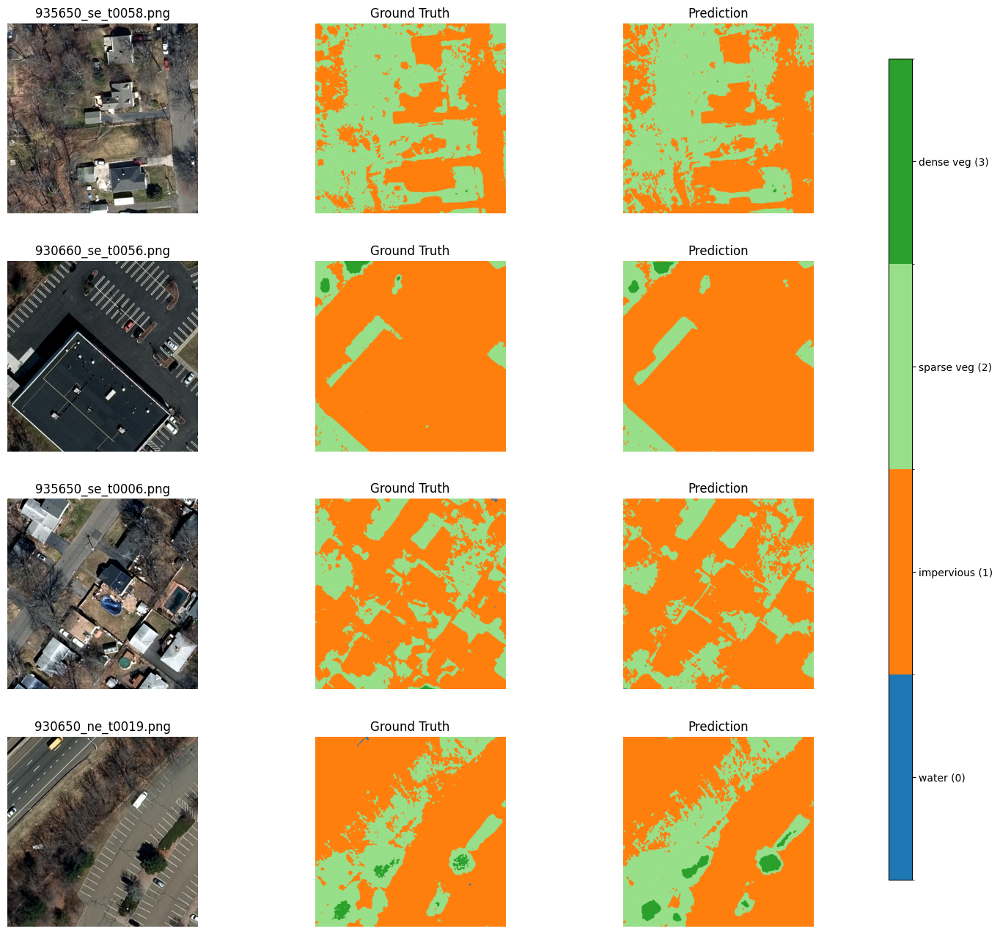

In [102]:
# Paths
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject/dataset_tiles_512_uint8_norm")
IMG_OUT   = TILES_BASE / "images"
MSK_OUT   = TILES_BASE / "masks"

assert IMG_OUT.exists(), f"Missing images dir: {IMG_OUT}"
assert MSK_OUT.exists(), f"Missing masks dir: {MSK_OUT}"


# Locked comparison tiles

FIXED_TILES = [
    "935650_se_t0058.png",
    "930660_se_t0056.png",
    "935650_se_t0006.png",
    "930650_ne_t0019.png",
]

# ----------------------------
# Load BEST checkpoint
# ----------------------------
MODEL_NAME = "FullUNet_23L"
CKPT_PATH = Path(f"/content/drive/MyDrive/ResearchProject (1)/model_results(1)/FullUNet_23L_best.pt")

assert CKPT_PATH.exists(), f"Checkpoint not found: {CKPT_PATH}"

model = model_unet
state = torch.load(CKPT_PATH, map_location=DEVICE)
model.load_state_dict(state)
model.to(DEVICE)
model.eval()

# ----------------------------
# Mask colormap
# ----------------------------
class_names  = ["water (0)", "impervious (1)", "sparse veg (2)", "dense veg (3)"]
class_colors = ["#1f77b4", "#ff7f0e", "#98df8a", "#2ca02c"]
cmap_mask = ListedColormap(class_colors)
norm_mask = BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], cmap_mask.N)


def load_rgb_tile(img_fp: Path):
    """Returns (H,W,3) uint8 and (1,3,H,W) float32 tensor in [0,1]."""
    rgb_u8 = np.array(Image.open(img_fp).convert("RGB"), dtype=np.uint8)
    x = torch.from_numpy(rgb_u8).permute(2, 0, 1).float() / 255.0  # (3,H,W)
    x = x.unsqueeze(0)  # (1,3,H,W)
    return rgb_u8, x

def load_mask_tile_for_image(img_name: str):
    """
    Robust: tries both
      masks/<stem>_mask.png
      masks/<img_name>
    Returns (H,W) uint8 labels 0..3
    """
    stem = Path(img_name).stem
    m1 = MSK_OUT / f"{stem}_mask.png"
    m2 = MSK_OUT / img_name

    if m1.exists():
        msk_fp = m1
    elif m2.exists():
        msk_fp = m2
    else:
        raise FileNotFoundError(f"No mask found for {img_name} (tried {m1.name} and {m2.name})")

    m = np.array(Image.open(msk_fp), dtype=np.uint8)
    if m.ndim == 3:
        m = m[..., 0]
    return m

@torch.no_grad()
def predict_tile(model, x):
    """x: (1,3,H,W) -> pred: (H,W) uint8"""
    x = x.to(DEVICE, non_blocking=True)
    logits = model(x)
    # Some models return dict with "out"
    if isinstance(logits, dict):
        logits = logits["out"]
    pred = torch.argmax(logits, dim=1).squeeze(0).detach().cpu().numpy().astype(np.uint8)
    return pred

# Plot: RGB | GT | Pred

rows = len(FIXED_TILES)
fig, axs = plt.subplots(rows, 3, figsize=(16, 4 * rows))

# make axs always 2D even if rows==1
if rows == 1:
    axs = np.expand_dims(axs, axis=0)

for i, name in enumerate(FIXED_TILES):
    img_fp = IMG_OUT / name
    assert img_fp.exists(), f"Missing image: {img_fp}"

    rgb_u8, x = load_rgb_tile(img_fp)
    gt = load_mask_tile_for_image(name)
    pred = predict_tile(model, x)

    axs[i, 0].imshow(rgb_u8)
    axs[i, 0].set_title(name)
    axs[i, 0].axis("off")

    im_gt = axs[i, 1].imshow(gt, cmap=cmap_mask, norm=norm_mask)
    axs[i, 1].set_title("Ground Truth")
    axs[i, 1].axis("off")

    im_pred = axs[i, 2].imshow(pred, cmap=cmap_mask, norm=norm_mask)
    axs[i, 2].set_title("Prediction")
    axs[i, 2].axis("off")

# Leave room on right for colorbar
fig.subplots_adjust(right=0.90, wspace=0.05, hspace=0.25)

# Colorbar axis (outside plots)
cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im_pred, cax=cax, ticks=[0, 1, 2, 3])
cbar.set_ticklabels(class_names)

plt.show()

**DeepLabV3-ResNet50 Model**

In [103]:
MODEL_NAME = "DeepLabV3_ResNet50"
NUM_CLASSES = 4

model = torchvision.models.segmentation.deeplabv3_resnet50(
    weights=None,
    weights_backbone=None
)

# Replace classifier head
in_ch = model.classifier[-1].in_channels
model.classifier[-1] = nn.Conv2d(in_ch, NUM_CLASSES, kernel_size=1)

# Replace aux classifier head (if it exists)
if model.aux_classifier is not None:
    in_ch_aux = model.aux_classifier[-1].in_channels
    model.aux_classifier[-1] = nn.Conv2d(in_ch_aux, NUM_CLASSES, kernel_size=1)

model = model.to(DEVICE)

print("Model:", MODEL_NAME)
print("Output head channels:", NUM_CLASSES)


Model: DeepLabV3_ResNet50
Output head channels: 4


**Train DeepLabV3-ResNet50 Model**

In [104]:
best_deeplab, hist_deeplab = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    model_name=MODEL_NAME,
    device=DEVICE,
    lr=1e-4,
    weight_decay=1e-4,
    epochs=10,
    results_dir="/content/drive/MyDrive/ResearchProject/model_results"
)


[DeepLabV3_ResNet50] Epoch 01/10 | val_f1=0.4568 val_iou=0.3313 loss=1.5639 | time(train/val)=26.5s/1.7s
[DeepLabV3_ResNet50] Epoch 02/10 | val_f1=0.5944 val_iou=0.4986 loss=1.0512 | time(train/val)=30.3s/1.6s
[DeepLabV3_ResNet50] Epoch 03/10 | val_f1=0.7189 val_iou=0.5954 loss=0.9624 | time(train/val)=29.6s/1.6s
[DeepLabV3_ResNet50] Epoch 04/10 | val_f1=0.6566 val_iou=0.5534 loss=0.9143 | time(train/val)=29.6s/1.6s
[DeepLabV3_ResNet50] Epoch 05/10 | val_f1=0.5549 val_iou=0.4205 loss=1.4238 | time(train/val)=26.1s/1.7s
[DeepLabV3_ResNet50] Epoch 06/10 | val_f1=0.6398 val_iou=0.5189 loss=1.1083 | time(train/val)=26.3s/1.7s
[DeepLabV3_ResNet50] Epoch 07/10 | val_f1=0.7548 val_iou=0.6246 loss=0.8419 | time(train/val)=26.2s/1.6s
[DeepLabV3_ResNet50] Epoch 08/10 | val_f1=0.6796 val_iou=0.5794 loss=0.7912 | time(train/val)=30.2s/1.7s
[DeepLabV3_ResNet50] Epoch 09/10 | val_f1=0.7246 val_iou=0.6131 loss=0.7877 | time(train/val)=26.3s/1.7s
[DeepLabV3_ResNet50] Epoch 10/10 | val_f1=0.6958 val_io

**DeepLabV3-ResNet50 Loss vs Epoch Graph**

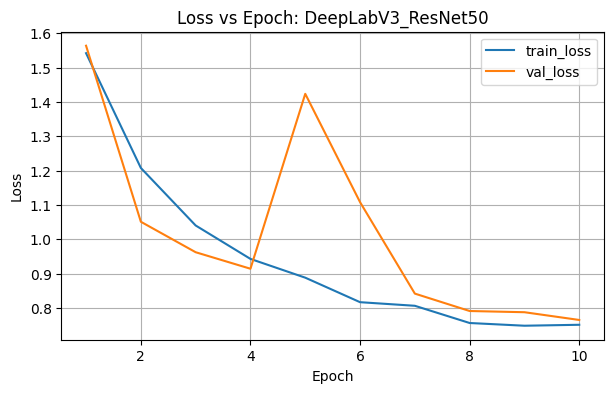

Best epoch: 7 | Best val_f1_macro: 0.754833459854126


In [106]:
def plot_loss(history, title="Loss vs Epoch"):
    epochs = [row["epoch"] for row in history]
    train_loss = [row["train_loss"] for row in history]
    val_loss = [row["val_loss"] for row in history]

    plt.figure(figsize=(7,4))
    plt.plot(epochs, train_loss, label="train_loss")
    plt.plot(epochs, val_loss, label="val_loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

plot_loss(hist_deeplab, title="Loss vs Epoch: DeepLabV3_ResNet50")
print(f"Best epoch: {best_deeplab['epoch']} | Best val_f1_macro: {best_deeplab['val_f1_macro']}")

**DeepLabV3-ResNet50 Model RGB vs Ground Truth vs Prediction Visualization**

Loading checkpoint: /content/drive/MyDrive/ResearchProject/model_results/DeepLabV3_ResNet50_best.pt


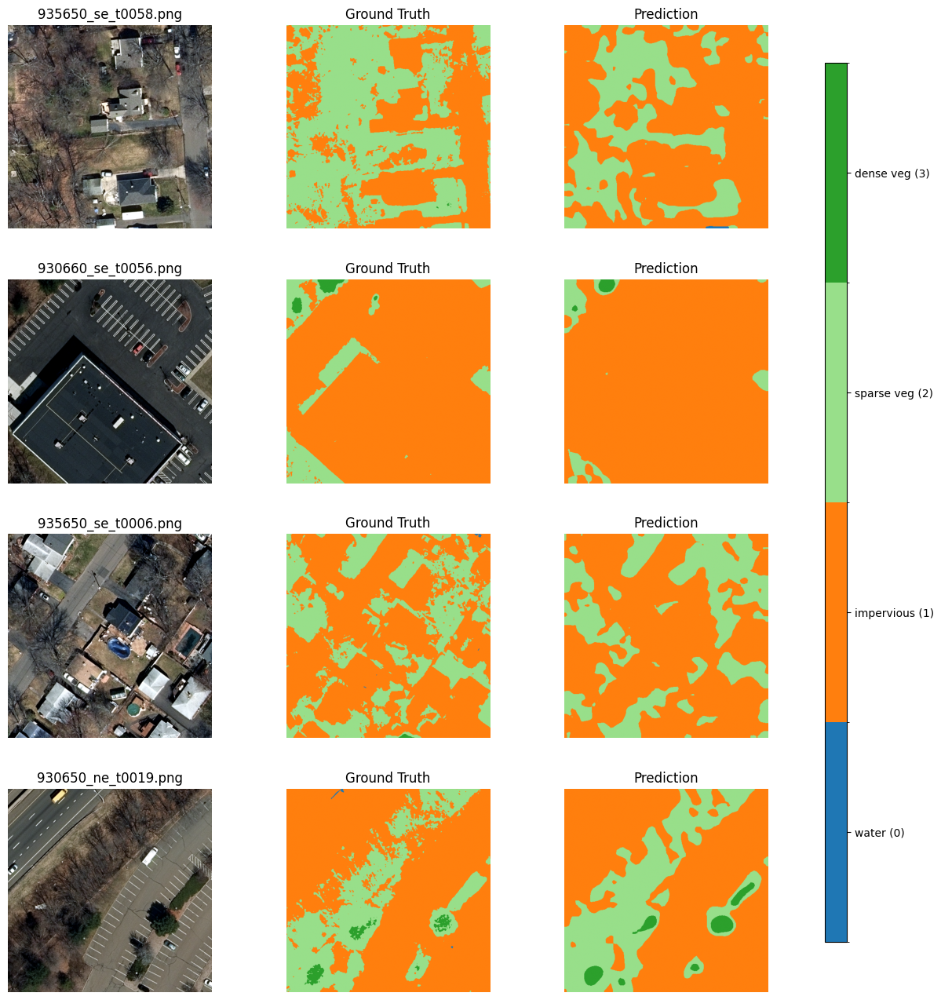

In [107]:
# ---- paths (your notebook) ----
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject/dataset_tiles_512_uint8_norm")
IMG_DIR = TILES_BASE / "images"
MSK_DIR = TILES_BASE / "masks"

# ---- locked tiles (same ones you locked for UNet) ----
FIXED_TILES = [
    "935650_se_t0058.png",
    "930660_se_t0056.png",
    "935650_se_t0006.png",
    "930650_ne_t0019.png",
]

# ---- load best checkpoint into the SAME DeepLab model object (model) ----
ckpt_path = Path(best_deeplab["path_ckpt"])
print("Loading checkpoint:", ckpt_path)

state = torch.load(ckpt_path, map_location=DEVICE)
# handle both raw state_dict and wrapped checkpoint dicts
if isinstance(state, dict) and any(k in state for k in ["state_dict", "model_state_dict", "net"]):
    for k in ["state_dict", "model_state_dict", "net"]:
        if k in state:
            state = state[k]
            break

# strip "module." if present (DataParallel)
clean_state = {}
for k, v in state.items():
    clean_state[k.replace("module.", "")] = v

model.load_state_dict(clean_state)
model.to(DEVICE)
model.eval()

# ---- colormap ----
class_colors = ["#1f77b4", "#ff7f0e", "#98df8a", "#2ca02c"]
cmap_mask = ListedColormap(class_colors)
norm_mask = BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], ncolors=4)

# ---- plotting ----
rows = len(FIXED_TILES)
fig, axes = plt.subplots(rows, 3, figsize=(14, 4 * rows))
if rows == 1:
    axes = axes.reshape(1, 3)

last_im = None

for i, fname in enumerate(FIXED_TILES):
    img_fp = IMG_DIR / fname
    msk_fp = MSK_DIR / f"{Path(fname).stem}_mask.png"

    assert img_fp.exists(), f"Missing image: {img_fp}"
    assert msk_fp.exists(), f"Missing mask: {msk_fp}"

    # RGB
    rgb = np.array(Image.open(img_fp).convert("RGB"), dtype=np.uint8)

    # Ground truth mask
    gt = np.array(Image.open(msk_fp), dtype=np.uint8)
    if gt.ndim == 3:
        gt = gt[..., 0].astype(np.uint8)

    # Model input (1,3,H,W) in [0,1]
    x = torch.from_numpy(rgb).permute(2, 0, 1).float().unsqueeze(0) / 255.0
    x = x.to(DEVICE)

    with torch.no_grad():
        out = model(x)
        if isinstance(out, dict):
            out = out["out"]
        pred = torch.argmax(out, dim=1).squeeze(0).cpu().numpy().astype(np.uint8)

    # RGB
    axes[i, 0].imshow(rgb)
    axes[i, 0].set_title(fname)
    axes[i, 0].axis("off")

    # GT
    axes[i, 1].imshow(gt, cmap=cmap_mask, norm=norm_mask)
    axes[i, 1].set_title("Ground Truth")
    axes[i, 1].axis("off")

    # Pred
    last_im = axes[i, 2].imshow(pred, cmap=cmap_mask, norm=norm_mask)
    axes[i, 2].set_title("Prediction")
    axes[i, 2].axis("off")

# ---- colorbar on right ----
fig.subplots_adjust(right=0.88, wspace=0.02, hspace=0.25)
cax = fig.add_axes([0.90, 0.15, 0.02, 0.70])
cbar = fig.colorbar(last_im, cax=cax, ticks=[0, 1, 2, 3])
cbar.set_ticklabels(["water (0)", "impervious (1)", "sparse veg (2)", "dense veg (3)"])

plt.show()

**SPANetFull (ResNet50 backbone) Model**

In [111]:
from torchvision.models import resnet50, ResNet50_Weights

MODEL_NAME = "SPANetFull_ResNet50"
print("Model:", MODEL_NAME)

# ----------------------------
# ResNet50 encoder (low + high)
# ----------------------------
class ResNet50Encoder(nn.Module):
    def __init__(self, pretrained=True):
        super().__init__()
        weights = ResNet50_Weights.DEFAULT if pretrained else None
        base = resnet50(weights=weights)

        self.stem = nn.Sequential(
            base.conv1,
            base.bn1,
            base.relu,
            base.maxpool,   # -> H/4, W/4
        )
        self.layer1 = base.layer1   # -> H/4,  W/4,  C=256
        self.layer2 = base.layer2   # -> H/8,  W/8,  C=512   (low)
        self.layer3 = base.layer3   # -> H/16, W/16, C=1024
        self.layer4 = base.layer4   # -> H/32, W/32, C=2048  (high)

    def forward(self, x):
        x = self.stem(x)
        x = self.layer1(x)
        low = self.layer2(x)         # (B,512,H/8,W/8)
        x = self.layer3(low)
        high = self.layer4(x)        # (B,2048,H/32,W/32)
        return low, high


# ---------------------------------------------
# SPAM block (successive pooling attention)
# ---------------------------------------------
class SPAMBlock(nn.Module):
    def __init__(self, in_channels, pool_sizes=(1, 2, 4), reduction=4):
        super().__init__()
        self.pool_sizes = pool_sizes
        mid_channels = max(in_channels // reduction, 1)

        self.conv_reduce = nn.Conv2d(in_channels * len(pool_sizes), mid_channels, kernel_size=1, bias=False)
        self.bn_reduce = nn.BatchNorm2d(mid_channels)
        self.relu = nn.ReLU(inplace=True)

        self.conv_attn = nn.Conv2d(mid_channels, in_channels, kernel_size=1, bias=True)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        B, C, H, W = x.shape
        pooled_list = []
        for ps in self.pool_sizes:
            p = F.adaptive_avg_pool2d(x, output_size=(ps, ps))
            p = F.interpolate(p, size=(H, W), mode="bilinear", align_corners=False)
            pooled_list.append(p)

        multi_scale = torch.cat(pooled_list, dim=1)              # (B, C*len(pool_sizes), H, W)
        h = self.relu(self.bn_reduce(self.conv_reduce(multi_scale)))
        attn = self.sigmoid(self.conv_attn(h))                   # (B, C, H, W)
        return x * attn


# ---------------------------------------------
# Feature Fusion Module (high -> gate low)
# ---------------------------------------------
class FeatureFusionModule(nn.Module):
    def __init__(self, low_channels, high_channels):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        mid_channels = max(low_channels // 4, 1)

        self.conv1 = nn.Conv2d(high_channels, mid_channels, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(mid_channels)
        self.relu = nn.ReLU(inplace=True)

        self.conv2 = nn.Conv2d(mid_channels, low_channels, kernel_size=1, bias=True)
        self.sigmoid = nn.Sigmoid()

    def forward(self, low, high):
        B, C_l, H_l, W_l = low.shape

        h = self.pool(high)                     # (B, C_h, 1, 1)
        h = self.relu(self.bn1(self.conv1(h)))  # (B, mid, 1, 1)
        h = self.sigmoid(self.conv2(h))         # (B, C_l, 1, 1)

        attn = h.expand(-1, -1, H_l, W_l)
        fused = low * attn
        return fused


# ---------------------------------------------
# Full SPANet-style segmentation network
# ---------------------------------------------
class SPANetFull(nn.Module):
    def __init__(self, num_classes=4, pretrained_backbone=True):
        super().__init__()
        self.encoder = ResNet50Encoder(pretrained=pretrained_backbone)

        self.low_ch = 512
        self.high_ch = 2048

        self.spam_low = SPAMBlock(self.low_ch)
        self.spam_high = SPAMBlock(self.high_ch)

        self.ffm = FeatureFusionModule(self.low_ch, self.high_ch)

        # simple decoder
        self.dec_conv1 = nn.Conv2d(self.low_ch, 256, kernel_size=3, padding=1)
        self.dec_bn1 = nn.BatchNorm2d(256)
        self.dec_conv2 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.dec_bn2 = nn.BatchNorm2d(128)

        self.classifier = nn.Conv2d(128, num_classes, kernel_size=1)

    def forward(self, x):
        H, W = x.shape[-2:]
        low, high = self.encoder(x)

        low_enh = self.spam_low(low)
        high_enh = self.spam_high(high)

        fused_low = self.ffm(low_enh, high_enh)         # (B,512,H/8,W/8)

        y = self.dec_bn1(F.relu(self.dec_conv1(fused_low)))
        y = F.interpolate(y, scale_factor=2, mode="bilinear", align_corners=False)  # -> H/4

        y = self.dec_bn2(F.relu(self.dec_conv2(y)))
        y = F.interpolate(y, size=(H, W), mode="bilinear", align_corners=False)     # -> H,W

        logits = self.classifier(y)  # (B, num_classes, H, W)
        return logits


Model: SPANetFull_ResNet50


**Train SPANetFull (ResNet50 backbone) Model**

In [112]:
MODEL_NAME = "SPANetFull_ResNet50"
model_spanet = SPANetFull(num_classes=4, pretrained_backbone=True).to(DEVICE)
model_spanet.train()

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 185MB/s]


SPANetFull(
  (encoder): ResNet50Encoder(
    (stem): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    )
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (

In [113]:
model_spanet = SPANetFull(num_classes=4, pretrained_backbone=True).to(DEVICE)

best_spanet, hist_spanet = train_model(
    model=model_spanet,
    train_loader=train_loader,
    val_loader=val_loader,
    model_name=MODEL_NAME,
    device=DEVICE,
    lr=1e-4,
    weight_decay=1e-4,
    epochs=10,
    results_dir="/content/drive/MyDrive/ResearchProject (1)/model_results"
)

[SPANetFull_ResNet50] Epoch 01/10 | val_f1=0.7908 val_iou=0.6861 loss=0.8164 | time(train/val)=27.4s/1.8s
[SPANetFull_ResNet50] Epoch 02/10 | val_f1=0.7963 val_iou=0.6858 loss=0.8351 | time(train/val)=27.4s/1.6s
[SPANetFull_ResNet50] Epoch 03/10 | val_f1=0.8157 val_iou=0.7128 loss=0.7286 | time(train/val)=29.4s/1.7s
[SPANetFull_ResNet50] Epoch 04/10 | val_f1=0.8134 val_iou=0.7128 loss=0.7132 | time(train/val)=29.4s/1.7s
[SPANetFull_ResNet50] Epoch 05/10 | val_f1=0.8165 val_iou=0.7171 loss=0.6792 | time(train/val)=27.3s/1.7s
[SPANetFull_ResNet50] Epoch 06/10 | val_f1=0.8248 val_iou=0.7237 loss=0.6799 | time(train/val)=29.6s/1.7s
[SPANetFull_ResNet50] Epoch 07/10 | val_f1=0.8203 val_iou=0.7184 loss=0.6802 | time(train/val)=29.6s/1.7s
[SPANetFull_ResNet50] Epoch 08/10 | val_f1=0.8282 val_iou=0.7276 loss=0.6631 | time(train/val)=27.3s/1.7s
[SPANetFull_ResNet50] Epoch 09/10 | val_f1=0.8220 val_iou=0.7181 loss=0.6846 | time(train/val)=29.2s/1.7s
[SPANetFull_ResNet50] Epoch 10/10 | val_f1=0.8

**SPANetFull (ResNet50 backbone) Model Loss vs Epoch Graph**

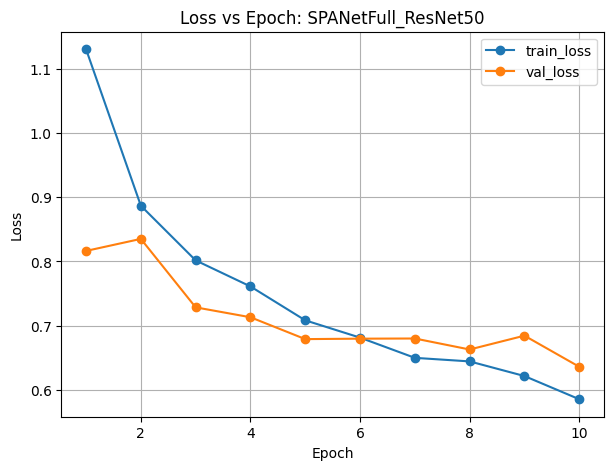

Best epoch: 10 | Best val_f1_macro: 0.8292


In [114]:
epochs = [h["epoch"] for h in hist_spanet]
train_loss = [h["train_loss"] for h in hist_spanet]
val_loss = [h["val_loss"] for h in hist_spanet]

plt.figure(figsize=(7,5))
plt.plot(epochs, train_loss, marker="o", label="train_loss")
plt.plot(epochs, val_loss, marker="o", label="val_loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss vs Epoch: SPANetFull_ResNet50")
plt.legend()
plt.grid(True)
plt.show()

print(
    f"Best epoch: {best_spanet['epoch']} | "
    f"Best val_f1_macro: {best_spanet['val_f1_macro']:.4f}"
)

**SPANetFull (ResNet50 backbone) Model RGB vs Ground Truth vs Prediction Visualization**

Loading checkpoint: /content/drive/MyDrive/ResearchProject (1)/model_results/SPANetFull_ResNet50_best.pt


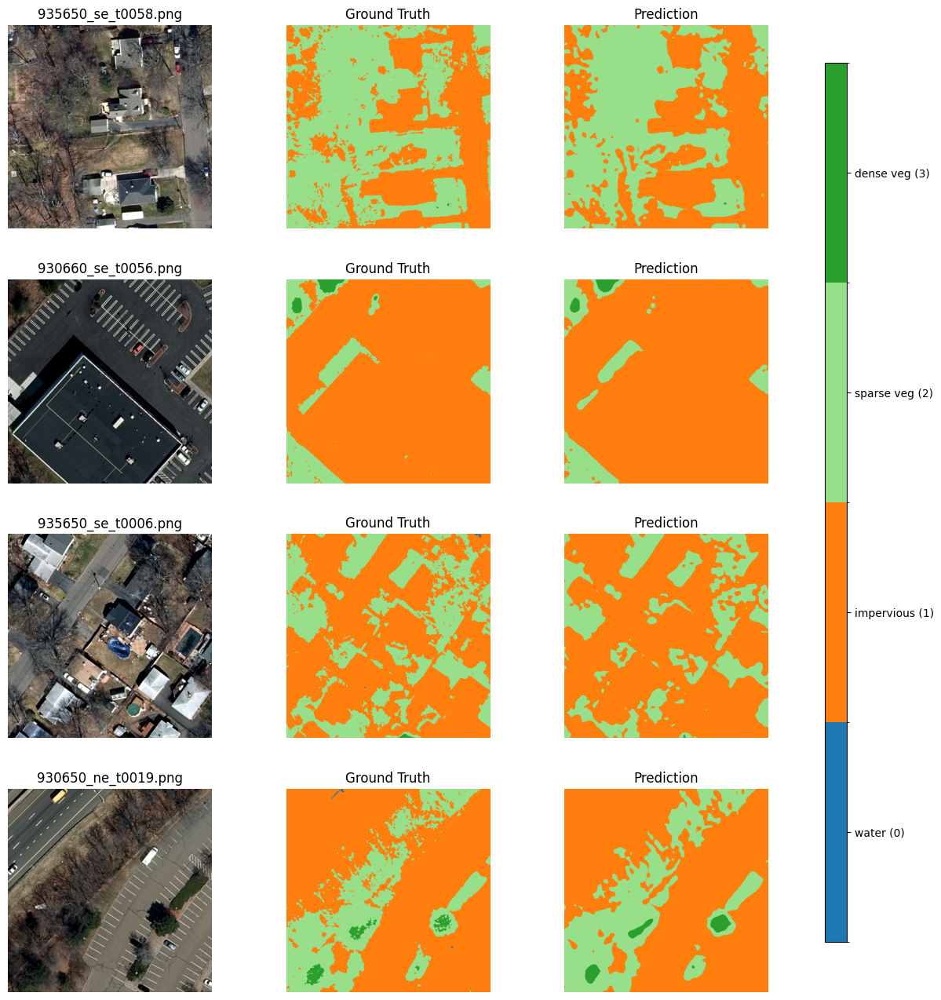

In [118]:
# ---- paths ----
TILES_BASE = Path("/content/drive/MyDrive/ResearchProject/dataset_tiles_512_uint8_norm")
IMG_DIR = TILES_BASE / "images"
MSK_DIR = TILES_BASE / "masks"

# ---- locked visuals (CURRENT notebook) ----
FIXED_TILES = [
    "935650_se_t0058.png",
    "930660_se_t0056.png",
    "935650_se_t0006.png",
    "930650_ne_t0019.png",
]

# ---- reload model + load best checkpoint ----
model = SPANetFull(num_classes=4, pretrained_backbone=False).to(DEVICE)

ckpt_path = Path(best_spanet["path_ckpt"])
print("Loading checkpoint:", ckpt_path)
state = torch.load(ckpt_path, map_location=DEVICE)
model.load_state_dict(state)

model.eval()

# ---- colormap ----
# 0 water, 1 impervious, 2 sparse veg, 3 dense veg
class_colors = ["#1f77b4", "#ff7f0e", "#98df8a", "#2ca02c"]
cmap_mask = ListedColormap(class_colors)
norm_mask = BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], ncolors=4)

# ---- plot ----
rows = len(FIXED_TILES)
fig, axes = plt.subplots(rows, 3, figsize=(14, 4 * rows))

# If rows == 1, axes won't be 2D, so normalize it
if rows == 1:
    axes = np.expand_dims(axes, axis=0)

for i, fname in enumerate(FIXED_TILES):
    img_fp = IMG_DIR / fname
    msk_fp = MSK_DIR / f"{Path(fname).stem}_mask.png"

    assert img_fp.exists(), f"Missing image: {img_fp}"
    assert msk_fp.exists(), f"Missing mask: {msk_fp}"

    # RGB
    rgb = np.array(Image.open(img_fp).convert("RGB"), dtype=np.uint8)

    # GT mask
    gt = np.array(Image.open(msk_fp), dtype=np.uint8)
    if gt.ndim == 3:
        gt = gt[:, :, 0].astype(np.uint8)

    # Model input (1,3,H,W)
    x = torch.from_numpy(rgb).permute(2, 0, 1).float().unsqueeze(0) / 255.0
    x = x.to(DEVICE)

    with torch.no_grad():
        out = model(x)
        if isinstance(out, dict):  # safety if model returns {"out": logits}
            out = out["out"]
        pred = torch.argmax(out, dim=1).squeeze(0).detach().cpu().numpy().astype(np.uint8)

    # RGB
    axes[i, 0].imshow(rgb)
    axes[i, 0].set_title(fname)
    axes[i, 0].axis("off")

    # GT
    axes[i, 1].imshow(gt, cmap=cmap_mask, norm=norm_mask)
    axes[i, 1].set_title("Ground Truth")
    axes[i, 1].axis("off")

    # Pred
    im = axes[i, 2].imshow(pred, cmap=cmap_mask, norm=norm_mask)
    axes[i, 2].set_title("Prediction")
    axes[i, 2].axis("off")

# ---- single colorbar (right side) ----
fig.subplots_adjust(right=0.88, wspace=0.02, hspace=0.25)
cax = fig.add_axes([0.90, 0.15, 0.02, 0.70])
cbar = fig.colorbar(im, cax=cax, ticks=[0, 1, 2, 3])
cbar.set_ticklabels(["water (0)", "impervious (1)", "sparse veg (2)", "dense veg (3)"])

plt.show()

**Comparison Table**

In [121]:
import pandas as pd
# Main results folder (your current notebook)
RESULTS_DIR = Path("/content/drive/MyDrive/ResearchProject (1)/model_results")

# Optional fallback (in case one model saved to the other folder earlier)
FALLBACK_DIRS = [
    Path("/content/drive/MyDrive/ResearchProject/model_results"),
    Path("/content/drive/MyDrive/ResearchProject (1)/model_results(1)"),
]

MODELS = {
    "UNet": "FullUNet_23L_best_metrics.json",
    "DeepLabV3-ResNet50": "DeepLabV3_ResNet50_best_metrics.json",
    "SPANetFull": "SPANetFull_ResNet50_best_metrics.json",
}

def resolve_metrics_path(fname: str) -> Path | None:
    p = RESULTS_DIR / fname
    if p.exists():
        return p
    for d in FALLBACK_DIRS:
        alt = d / fname
        if alt.exists():
            return alt
    return None

rows = []
missing = []

for model_name, fname in MODELS.items():
    path = resolve_metrics_path(fname)
    if path is None:
        missing.append((model_name, fname))
        continue

    with open(path, "r") as f:
        data = json.load(f)

    best = data.get("best", data)  # supports either {"best": {...}} or direct dict

    f1_pc = best.get("val_f1_per_class", [None]*4)
    prec_pc = best.get("val_prec_per_class", [None]*4)
    rec_pc = best.get("val_rec_per_class", [None]*4)

    row = {
        "Model": model_name,
        "Metrics File": str(path),
        "Best Epoch": best.get("epoch", None),
        "Mean F1 (macro)": best.get("val_f1_macro", None),
        "Mean IoU (macro)": best.get("val_iou_macro", None),
        "Pixel Accuracy": best.get("val_pixel_acc", None),

        "F1 Water": f1_pc[0],
        "F1 Impervious": f1_pc[1],
        "F1 Sparse Veg": f1_pc[2],
        "F1 Dense Veg": f1_pc[3],

        "Prec Water": prec_pc[0],
        "Prec Impervious": prec_pc[1],
        "Prec Sparse Veg": prec_pc[2],
        "Prec Dense Veg": prec_pc[3],

        "Recall Water": rec_pc[0],
        "Recall Impervious": rec_pc[1],
        "Recall Sparse Veg": rec_pc[2],
        "Recall Dense Veg": rec_pc[3],
    }
    rows.append(row)

if missing:
    print(" Missing metrics files:")
    for m, f in missing:
        print(f"  - {m}: {f}")
    print("\nTip: confirm the exact filenames in your Drive folder:", RESULTS_DIR)

df = pd.DataFrame(rows)

# Sort by Mean F1 (macro) descending (best model on top)
if "Mean F1 (macro)" in df.columns and len(df) > 0:
    df = df.sort_values("Mean F1 (macro)", ascending=False)

# Nice formatting (optional)
pd.set_option("display.max_columns", 200)
pd.set_option("display.width", 200)

df

,Model,Metrics File,Best Epoch,Mean F1 (macro),Mean IoU (macro),Pixel Accuracy,F1 Water,F1 Impervious,F1 Sparse Veg,F1 Dense Veg,Prec Water,Prec Impervious,Prec Sparse Veg,Prec Dense Veg,Recall Water,Recall Impervious,Recall Sparse Veg,Recall Dense Veg
0,UNet,/content/drive/MyDrive/ResearchProject/model_r...,10,0.841416,0.748866,0.910171,0.968275,0.922322,0.865168,0.609898,0.969509,0.920865,0.868935,0.527345,0.967045,0.923785,0.861432,0.723094
2,SPANetFull,/content/drive/MyDrive/ResearchProject (1)/mod...,10,0.829198,0.730441,0.898592,0.961241,0.914428,0.840401,0.600723,0.983306,0.883195,0.894762,0.630494,0.940144,0.947951,0.792268,0.573636
1,DeepLabV3-ResNet50,/content/drive/MyDrive/ResearchProject/model_r...,7,0.754833,0.624573,0.830216,0.874060,0.854809,0.764416,0.526049,0.794551,0.862720,0.791906,0.513995,0.971252,0.847041,0.738771,0.538681


In [122]:
df_round = df.copy()
numeric_cols = df_round.select_dtypes(include=["float64", "float32"]).columns
df_round[numeric_cols] = df_round[numeric_cols].round(4)
df_round[["Model", "Mean F1 (macro)", "Mean IoU (macro)", "Pixel Accuracy"]]

,Model,Mean F1 (macro),Mean IoU (macro),Pixel Accuracy
0,UNet,0.8414,0.7489,0.9102
2,SPANetFull,0.8292,0.7304,0.8986
1,DeepLabV3-ResNet50,0.7548,0.6246,0.8302
